---
# 5 NEURAL STYLE TRANSFER

Neural Style Transfer (NST) es una técnica de visión por computadora basada en redes neuronales profundas. Su objetivo es generar una nueva imagen que conserve el contenido de una imagen de entrada y adopte el estilo visual de otra.

Funciona utilizando una red neuronal convolucional preentrenada (como VGG19) para extraer representaciones internas (features) de ambas imágenes. Luego, optimiza una tercera imagen para que:

* Sus representaciones profundas en capas superiores coincidan con las del contenido (estructura)
* Sus representaciones estadísticas (matrices de Gram) en capas inferiores coincidan con las del estilo (textura y color)

Una característica específica de esta implementación de Neural Style Transfer es que no requiere entrenar un modelo ya que lo que se optimiza es la propia imagen : comenzando desde ruido aleatorio, se actualizan sus píxeles iterativamente para minimizar una función de pérdida que equilibra la preservación del contenido con la transferencia del estilo.


El resultado es una imagen que combina la estructura del contenido con la apariencia estética del estilo, y vamos a usar esta técnica para convertir fotos en pinturas con el estilo de un artista específico.



---
## 5.1 CONFIGURACIÓN

In [1]:
# Importaciones
import numpy as np
import os
import imageio
from PIL import Image
import requests
from tqdm import tqdm
import random
from io import BytesIO
from tensorflow.keras.applications import VGG16
from tensorflow.keras import Input, Model
import tensorflow as tf
from keras import backend
from keras.models import Model
from keras.applications.vgg16 import VGG16
import matplotlib.pyplot as plt
from scipy.optimize import fmin_l_bfgs_b
from IPython.display import Image as IPyImage

In [2]:
# Hiperparámetros del modelo de estilo

CHANNELS = 3  # Número de canales de color (RGB)
IMAGE_SIZE = 500  # Tamaño cuadrado de las imágenes generadas
IMAGE_WIDTH = IMAGE_SIZE  # Ancho de la imagen (se usa para mantener consistencia en nombre)
IMAGE_HEIGHT = IMAGE_SIZE  # Alto de la imagen

# Valores medios RGB del conjunto ImageNet, usados para preprocesamiento y normalización
IMAGENET_MEAN_RGB_VALUES = [123.68, 116.779, 103.939]

# Peso relativo de la pérdida de contenido en la función de pérdida total
CONTENT_WEIGHT = 0.02

# Peso relativo de la pérdida de estilo
STYLE_WEIGHT = 4.5

# Peso de la pérdida de variación total, que suaviza la imagen generada
TOTAL_VARIATION_WEIGHT = 0.995

# Exponente aplicado en la pérdida de variación total (usualmente 1.25 en implementaciones clásicas)
TOTAL_VARIATION_LOSS_FACTOR = 1.25

# Ruta base del proyecto
base_path = "/content/drive/MyDrive/practica image/"


Para aplicar nuestra técnica, vamos a usar **VGG16**. Es una red convolucional clásica, sencilla y bien entendida. Está preentrenada sobre el conjunto de datos ImageNet y se ha convertido en un estándar para tareas como la transferencia de estilo. A diferencia de modelos más complejos y modernos, como ResNet o EfficientNet, VGG16 tiene una arquitectura secuencial clara que facilita acceder a las activaciones intermedias, lo cual es clave en este caso. Además, fue el modelo utilizado en el trabajo original de Gatys et al., que introdujo la técnica de Neural Style Transfer.

Para capturar el estilo de una imagen, seleccionamos varias capas distribuidas a lo largo de la red, concretamente la primera capa de cada bloque convolucional. Estas primeras capas de cada bloque son las que mejor retienen la información de bajo nivel necesaria para representar el estilo visual, como texturas, colores, trazos y patrones repetitivos. Al incluir capas de distintos niveles de profundidad, conseguimos representar el estilo de forma más completa, desde detalles finos hasta estructuras globales.

En cambio, para preservar el contenido de la imagen, usamos una única capa intermedia. A diferencia de las de estilo, esta capa no es la primera de su bloque, sino una más profunda dentro de la red. Se encuentra en una posición donde la red ya ha capturado la estructura general y los elementos relevantes de la imagen, como formas y disposición espacial, pero aún no es tan abstracta como para perder la relación con los detalles visuales. Esto permite que la imagen generada mantenga la composición de la imagen de contenido, aplicando sobre ella el estilo extraído de otra imagen.



In [3]:
# Capas seleccionadas para pérdidas de contenido y estilo
content_layer_names = ["block4_conv2"]
style_layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

# Cargamos VGG16 preentrenado en ImageNet, sin las capas de clasificación
# El input shape es fijo según el tamaño que definimos para nuestras imágenes
vgg = VGG16(include_top=False, weights="imagenet", input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))
vgg.trainable = False  # No se entrena, solo se usa para extraer características

# Extraemos las salidas de las capas que nos interesan
outputs = [vgg.get_layer(name).output for name in content_layer_names + style_layer_names]

# Creamos un modelo que toma una imagen como entrada y devuelve solo las capas relevantes
vgg_model = Model(inputs=vgg.input, outputs=outputs)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [4]:
def load_and_process_image(image_path):
    """
    Loads and resizes an image from disk, converts it to float32,
    adds a batch dimension, and subtracts ImageNet mean for VGG.
    """
    img = Image.open(image_path).convert("RGB")
    img = img.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
    img_array = np.array(img).astype("float32")
    img_array = np.expand_dims(img_array, axis=0)

    # Preprocess for VGG: subtract ImageNet mean, convert RGB to BGR
    img_array[:, :, :, 0] -= IMAGENET_MEAN_RGB_VALUES[0]  # R
    img_array[:, :, :, 1] -= IMAGENET_MEAN_RGB_VALUES[1]  # G
    img_array[:, :, :, 2] -= IMAGENET_MEAN_RGB_VALUES[2]  # B
    img_array = img_array[:, :, :, ::-1]  # RGB → BGR

    return img_array

def show_generated_image(x, iteration, imagenet_mean=IMAGENET_MEAN_RGB_VALUES):
    """
    Muestra la imagen generada en una iteración específica del proceso de optimización.

    Esta función toma el array plano de la imagen generada, lo reconstruye en formato visual,
    revierte el preprocesamiento (de BGR a RGB y restaura la media de ImageNet) y la muestra
    usando matplotlib. No modifica el array original.

    Parámetros:
    - x: array NumPy plano (float32), con los píxeles de la imagen generada, forma (H * W * C,)
    - iteration: número de iteración actual (para el título de la figura)
    - imagenet_mean: lista de valores medios [R, G, B] usados durante el preprocesamiento

    Retorna:
    - Nada. Muestra la imagen por pantalla.
    """

    # Trabajamos sobre una copia de x para no modificar el original
    x_copy = x.copy().reshape((IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))

    # Convertimos de BGR a RGB (ya que el modelo trabaja en BGR)
    x_copy = x_copy[:, :, ::-1]

    # Restauramos los valores medios de ImageNet para volver al color original
    x_copy[:, :, 0] += imagenet_mean[0]
    x_copy[:, :, 1] += imagenet_mean[1]
    x_copy[:, :, 2] += imagenet_mean[2]

    # Limitamos los valores al rango [0, 255] y convertimos a enteros (uint8)
    x_copy = np.clip(x_copy, 0, 255).astype("uint8")

    # Mostramos la imagen con matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(x_copy)
    plt.title(f"Imagen generada - Iteración {iteration}")
    plt.axis("off")
    plt.show()


---
## 5.2 FUNCIONES DE PERDIDA

In [5]:
def gram_matrix(x):
    """
    Calcula la matriz de Gram de un mapa de características.

    La matriz de Gram representa las correlaciones entre los canales de un mapa de características
    y se utiliza para capturar el estilo de una imagen. Es una medida del nivel de activación
    conjunta entre pares de filtros de una red convolucional.

    Parámetros:
    - x: Tensor de forma (altura, ancho, canales), o bien (H, W, C)

    Retorna:
    - Una matriz de Gram de forma (C, C), donde C es el número de canales (filtros)
    """
    # Reorganiza el tensor en una matriz de forma (H*W, C), es decir, cada fila representa un píxel
    # y cada columna representa un canal de activación (filtro)
    x = tf.reshape(x, (-1, tf.shape(x)[-1]))  # shape: (H*W, C)

    # Calcula la matriz de Gram como el producto punto de la matriz con su transpuesta
    # El resultado es una matriz (C, C) que mide las correlaciones entre canales
    return tf.matmul(x, x, transpose_a=True)  # shape: (C, C)


def compute_average_style_grams(style_folder_path, max_images=20, randomize=False):
    """
    Carga hasta `max_images` imágenes de estilo desde una carpeta, las procesa en batch,
    y devuelve un diccionario con las matrices de Gram medias para cada capa de estilo.

    Esta función permite capturar un estilo general (por ejemplo, de un artista) combinando
    múltiples imágenes en lugar de una sola. Utiliza una red VGG para extraer las características
    de las capas seleccionadas y calcula la media de sus matrices de Gram.

    Parámetros:
    - style_folder_path: ruta a la carpeta que contiene imágenes de estilo (JPG o PNG)
    - max_images: máximo número de imágenes a procesar (por defecto 20)
    - randomize: si es True, selecciona imágenes aleatorias; si es False, toma las primeras

    Retorna:
    - Un diccionario: {nombre_capa: matriz_de_Gram_promediada (C, C)}
    """
    # Obtenemos las salidas de las capas de estilo seleccionadas
    outputs = [vgg.get_layer(name).output for name in style_layer_names]
    model = Model(inputs=vgg.input, outputs=outputs)

    # Listamos y seleccionamos las imágenes de estilo
    all_files = [f for f in os.listdir(style_folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if randomize:
        selected_files = random.sample(all_files, min(max_images, len(all_files)))
    else:
        selected_files = all_files[:max_images]

    if not selected_files:
        raise ValueError("No se encontraron imágenes válidas en la carpeta proporcionada.")

    print(f"Usando {len(selected_files)} imágenes de estilo desde: {style_folder_path}")

    # Cargamos y preprocesamos las imágenes seleccionadas
    images = []
    for fname in tqdm(selected_files, desc="Cargando imágenes de estilo"):
        path = os.path.join(style_folder_path, fname)
        img_array = load_and_process_image(path)  # Resultado: (1, H, W, 3)
        images.append(img_array[0])  # Quitamos la dimensión de batch

    # Convertimos la lista en un tensor de batch: (N, H, W, 3)
    batch_tensor = tf.convert_to_tensor(np.stack(images, axis=0))

    # Ejecutamos la red VGG una sola vez sobre todo el batch
    feature_batches = model(batch_tensor)

    # Calculamos las matrices de Gram y su media para cada capa
    style_targets = {}
    for name, feature_batch in zip(style_layer_names, feature_batches):
        grams = [gram_matrix(feature_batch[i]) for i in range(feature_batch.shape[0])]
        average_gram = tf.reduce_mean(grams, axis=0)
        style_targets[name] = average_gram

    return style_targets


def total_variation_loss(x):
    """
    Calcula la pérdida de variación total para una imagen.

    Esta pérdida penaliza los cambios abruptos entre píxeles vecinos, favoreciendo una
    imagen generada más suave y visualmente coherente. Se aplica sobre la imagen generada
    durante la optimización para reducir artefactos y ruido.

    Parámetros:
    - x: tensor de imagen de forma (1, alto, ancho, canales)

    Retorna:
    - Un escalar que representa la pérdida total de variación.
    """
    # Calcula las diferencias verticales entre píxeles adyacentes
    a = tf.square(x[:, :-1, :-1, :] - x[:, 1:, :-1, :])

    # Calcula las diferencias horizontales entre píxeles adyacentes
    b = tf.square(x[:, :-1, :-1, :] - x[:, :-1, 1:, :])

    # Eleva la suma de las diferencias a una potencia (suaviza el efecto de bordes duros)
    return tf.reduce_sum(tf.pow(a + b, 1.25))


def compute_loss(input_image_array, style_targets, combination_image):
    """
    Calcula la pérdida total que guía la generación de la imagen combinada.

    La pérdida total combina tres componentes:
    - Pérdida de contenido: garantiza que la imagen generada mantenga la estructura de la imagen original.
    - Pérdida de estilo: fuerza a que la imagen generada imite la textura y color del estilo promedio.
    - Pérdida de variación total: actúa como regularizador para suavizar la imagen final.

    Parámetros:
    - input_image_array: imagen de contenido ya preprocesada, de forma (1, H, W, 3)
    - style_targets: diccionario con las matrices de Gram promedio de cada capa de estilo
    - combination_image: variable optimizable (imagen generada), forma (1, H, W, 3)

    Retorna:
    - Un escalar TensorFlow que representa la pérdida total a minimizar.
    """
    # Concatenamos la imagen de contenido y la imagen generada para pasarlas juntas por VGG
    input_tensor = tf.concat([input_image_array, combination_image], axis=0)

    # Obtenemos las activaciones de las capas relevantes
    model_outputs = vgg_model(input_tensor)

    # Separamos salidas de contenido y de estilo
    content_outputs = model_outputs[:len(content_layer_names)]
    style_outputs = model_outputs[len(content_layer_names):]

    # Inicializamos la pérdida total
    loss = tf.constant(0.0)

    # --- Pérdida de contenido ---
    for content_output, name in zip(content_outputs, content_layer_names):
        content_feature = content_output[0]  # imagen de entrada
        combination_feature = content_output[1]  # imagen generada
        loss += CONTENT_WEIGHT * tf.reduce_sum(tf.square(combination_feature - content_feature))

    # --- Pérdida de estilo (usando Gram matrices ya precomputadas) ---
    for style_output, name in zip(style_outputs, style_layer_names):
        combination_feature = style_output[1]  # imagen generada
        c_gram = gram_matrix(combination_feature)  # matriz de Gram de la generada
        s_gram = style_targets[name]  # matriz de Gram promedio del estilo
        size = IMAGE_HEIGHT * IMAGE_WIDTH
        sl = tf.reduce_sum(tf.square(s_gram - c_gram)) / (4. * (CHANNELS**2) * (size**2))
        loss += (STYLE_WEIGHT / len(style_layer_names)) * sl

    # --- Pérdida de variación total para suavizar la imagen ---
    loss += TOTAL_VARIATION_WEIGHT * total_variation_loss(combination_image)

    return loss

@tf.function
def compute_loss_and_grads(input_image_array, style_targets, combination_image):
    """
    Calcula la pérdida total y sus gradientes respecto a la imagen generada.

    Esta función se usa durante la optimización. Utiliza `tf.GradientTape` para calcular cómo
    debe ajustarse la imagen generada (combination_image) para reducir la pérdida total.

    Parámetros:
    - input_image_array: imagen de contenido preprocesada, de forma (1, H, W, 3)
    - style_targets: diccionario con matrices de Gram promedio por capa
    - combination_image: variable optimizable, la imagen que se va generando

    Retorna:
    - loss_value: escalar con el valor actual de la pérdida total
    - grads: gradientes de la pérdida respecto a la imagen generada (misma forma que combination_image)
    """
    with tf.GradientTape() as tape:
        tape.watch(combination_image)  # Se asegura de que TensorFlow siga los cambios de la imagen generada
        loss_value = compute_loss(input_image_array, style_targets, combination_image)  # Calcula la pérdida total
    grads = tape.gradient(loss_value, combination_image)  # Calcula los gradientes con respecto a la imagen generada
    return loss_value, grads



In [6]:
class Evaluator:
    """
    Clase auxiliar que encapsula la evaluación de la pérdida y sus gradientes.

    Esta clase está diseñada para ser usada con optimizadores de tipo L-BFGS-B,
    que requieren dos funciones separadas: una para obtener la pérdida y otra para los gradientes.

    Almacena internamente los gradientes luego de calcular la pérdida, para evitar
    tener que volver a evaluarlos dos veces por iteración (lo cual es costoso).

    Parámetros:
    - input_image_array: imagen de contenido ya preprocesada
    - style_targets: diccionario con las matrices de Gram promedio del estilo
    """

    def __init__(self, input_image_array, style_targets):
        self.loss_value = None
        self.grads_values = None
        self.input_image_array = input_image_array
        self.style_targets = style_targets

    def loss(self, x):
        """
        Calcula la pérdida total y guarda los gradientes correspondientes.

        Parámetro:
        - x: vector plano (flattened) con los píxeles de la imagen generada

        Retorna:
        - loss_value: valor numérico de la pérdida total (float)
        """
        # Reconstruye la imagen desde el vector plano y convierte a tensor de TensorFlow
        x = x.reshape((1, IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS)).astype("float32")
        x_tensor = tf.Variable(x)

        # Calcula pérdida y gradientes usando la función definida anteriormente
        loss_value, grad_values = compute_loss_and_grads(self.input_image_array, self.style_targets, x_tensor)

        # Almacena los resultados en variables internas para reutilización
        self.loss_value = loss_value.numpy().astype("float64")
        self.grad_values = grad_values.numpy().flatten().astype("float64")
        return self.loss_value

    def gradients(self, x):
        """
        Devuelve los gradientes calculados previamente al llamar a `loss`.

        Parámetro:
        - x: vector plano con los píxeles (no se usa, pero es requerido por el optimizador)

        Retorna:
        - grad_values: vector plano de gradientes
        """
        return self.grad_values


---
## 5.3 GENERACIÓN

En lugar de utilizar una única imagen de estilo, como en la versión original de Neural Style Transfer, hemos modificado la técnica para que tenga en cuenta varias pinturas de un mismo artista. Lo que hacemos es cargar un conjunto de imágenes desde una carpeta y calcular, para cada capa de estilo, la matriz de Gram promedio entre todas las imágenes. De este modo, no transferimos el estilo de una pintura específica, sino que capturamos una representación más general y robusta del estilo característico del artista.

Esto es una buena idea porque permite evitar la dependencia de una única obra, que podría estar sesgada en cuanto a color, composición o nivel de detalle. Al combinar múltiples obras, la red aprende una especie de "promedio estilístico", que representa mejor los patrones, texturas y elecciones cromáticas que definen la estética del autor. El resultado suele ser más coherente y versátil, especialmente si se desea aplicar el estilo de un artista en general, y no de una pintura en particular.


In [7]:
def generate_image(input_image_path, style_folder_path, output_image_path, gif_path,  iterations=100):
    """
    Genera una imagen estilizada a partir de una imagen de contenido y un conjunto de imágenes de estilo.
    Guarda también un GIF con las imágenes generadas durante las iteraciones y registra la evolución de la pérdida.

    Parámetros:
    - input_image_path: ruta a la imagen de contenido
    - style_folder_path: carpeta con imágenes de estilo
    - output_image_path: ruta para guardar la imagen final
    - gif_path: ruta para guardar el GIF generado
    - iterations: número de iteraciones de optimización

    """
    # Inicialización
    style_targets = compute_average_style_grams(style_folder_path)
    input_image_array = load_and_process_image(input_image_path)
    x = np.random.uniform(0, 255, (1, IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS)).astype("float32") - 128.
    evaluator = Evaluator(input_image_array, style_targets)

    loss_history = []
    gif_frames = []

    for i in range(iterations):
        x, loss, info = fmin_l_bfgs_b(
            evaluator.loss,
            x.flatten(),
            fprime=evaluator.gradients,
            maxfun=20
        )

        loss_history.append(loss)

        # Guardar imagen cada iteración como frame del GIF
        x_image = x.copy().reshape((IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
        x_image = x_image[:, :, ::-1]
        x_image[:, :, 0] += IMAGENET_MEAN_RGB_VALUES[0]
        x_image[:, :, 1] += IMAGENET_MEAN_RGB_VALUES[1]
        x_image[:, :, 2] += IMAGENET_MEAN_RGB_VALUES[2]
        x_image = np.clip(x_image, 0, 255).astype("uint8")
        gif_frames.append(Image.fromarray(x_image))

        if i % 10 == 0:
            print(f"Iteración {i}/{iterations} - Pérdida: {loss:.2f}")
            show_generated_image(x, i)
        if i% 2 == 0:
            # Guardar el GIF animado
            gif_frames[0].save(gif_path, save_all=True, append_images=gif_frames[1:], duration=250, loop=0)

    # Postprocesamiento final
    x = x.reshape((IMAGE_HEIGHT, IMAGE_WIDTH, CHANNELS))
    x = x[:, :, ::-1]
    x[:, :, 0] += IMAGENET_MEAN_RGB_VALUES[0]
    x[:, :, 1] += IMAGENET_MEAN_RGB_VALUES[1]
    x[:, :, 2] += IMAGENET_MEAN_RGB_VALUES[2]
    x = np.clip(x, 0, 255).astype("uint8")
    output_image = Image.fromarray(x)
    output_image.save(output_image_path)

    # Imagen combinada para comparación visual
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Cargar y mostrar la imagen de contenido
    content_img = Image.open(input_image_path).resize((IMAGE_WIDTH, IMAGE_HEIGHT))
    axes[0].imshow(content_img)
    axes[0].set_title("Imagen original")
    axes[0].axis("off")

    # Cargar y mostrar la imagen generada
    output_img = Image.open(output_image_path).resize((IMAGE_WIDTH, IMAGE_HEIGHT))
    axes[1].imshow(output_img)
    axes[1].set_title("Imagen generada")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


    # Curva de pérdida como imagen
    plt.figure(figsize=(8, 4))
    plt.plot(loss_history, label="Pérdida")
    plt.xlabel("Iteración")
    plt.ylabel("Pérdida")
    plt.title("Historial de la función de pérdida")
    plt.legend()
    plt.grid(True)
    plt.show()




Usando 20 imágenes de estilo desde: /content/drive/MyDrive/practica image/data/Train/Vincent_van_Gogh


Cargando imágenes de estilo: 100%|██████████| 20/20 [00:25<00:00,  1.27s/it]


Iteración 0/41 - Pérdida: 9052956672.00


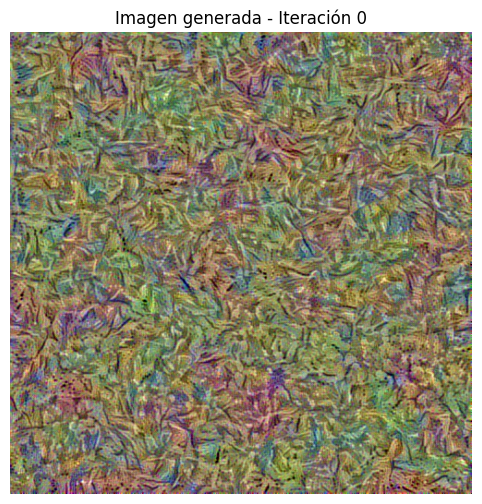

Iteración 10/41 - Pérdida: 3025550336.00


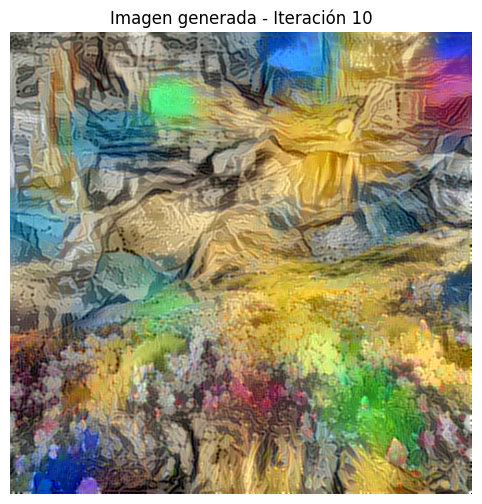

Iteración 20/41 - Pérdida: 2677381888.00


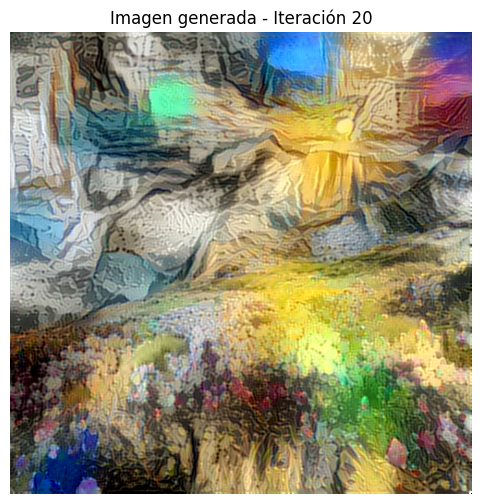

Iteración 30/41 - Pérdida: 2586718208.00


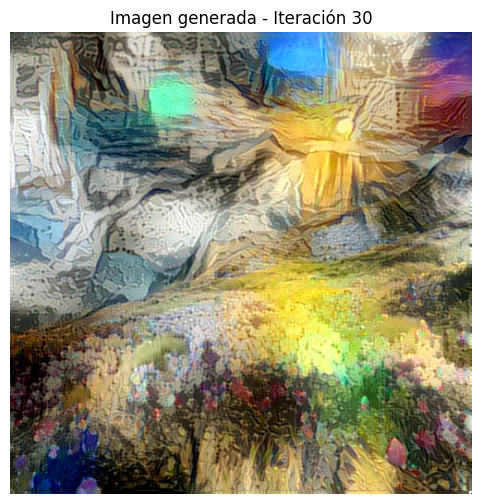

Iteración 40/41 - Pérdida: 2558118400.00


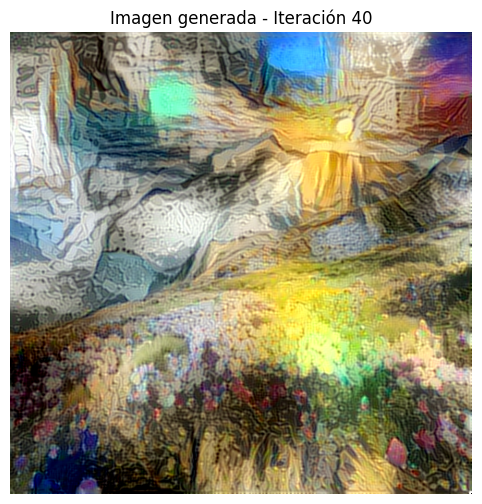

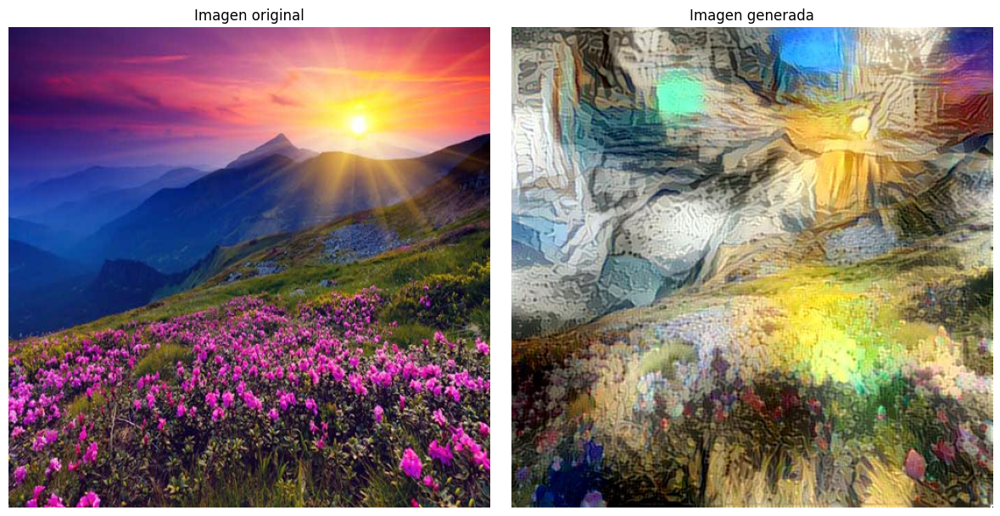

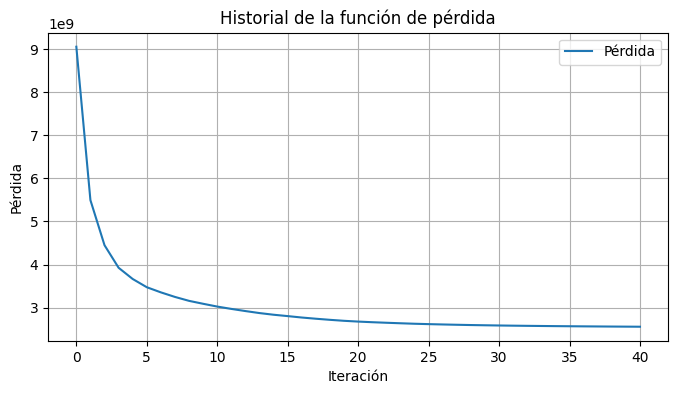

In [10]:
# Ruta a la imagen de contenido (fotografía que queremos transformar)
input_image_path = base_path + "data/generation/landscape.jpg"

# Carpeta que contiene múltiples pinturas del artista (en este caso, Van Gogh)
# Estas imágenes se usarán para calcular el estilo promedio
style_folder_path = base_path + "data/Train/Vincent_van_Gogh"

# Ruta donde se guardará la imagen final generada con transferencia de estilo
output_path = base_path + "data/generation/style_transfer_vgg_2.jpg"

# Ruta donde se guardará el GIF con el proceso de generación (una imagen por iteración)
gif_path = base_path + "data/generation/style_transfer_gif_1.gif"

generate_image(input_image_path, style_folder_path, output_path, gif_path, iterations=41)


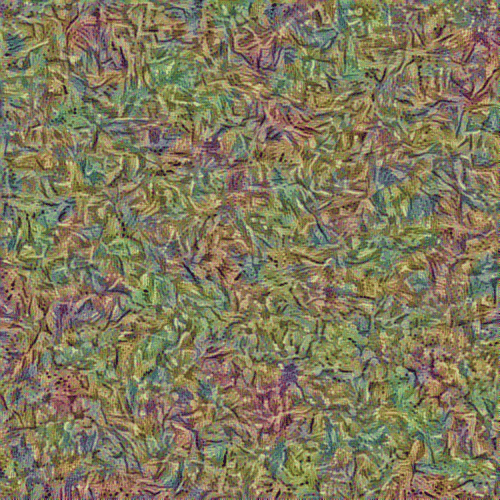

In [11]:
# Mostrar el gif
IPyImage(filename=gif_path)


Comparamos nuestra imagen original con la que hemos generado y una generada por una IA (Fotor) especializada en transformar imagenes.

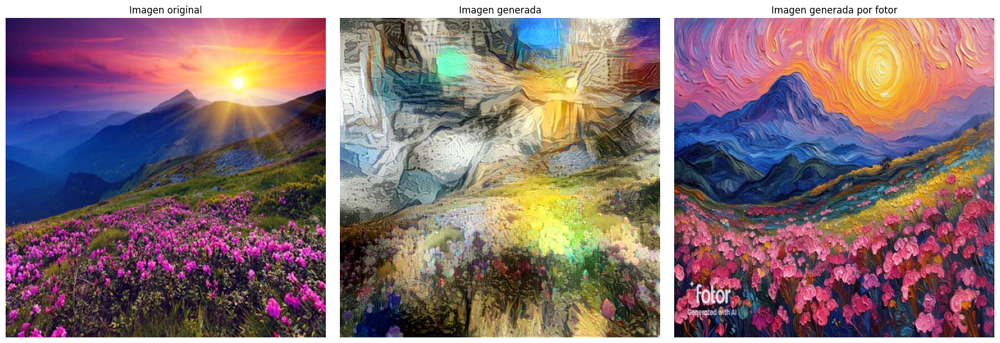

In [13]:
fotor_image_path = base_path + "data/generation/landscape_fotor.jpg"
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Imagen original (contenido)
content_img = Image.open(input_image_path).resize((IMAGE_WIDTH, IMAGE_HEIGHT))
axes[0].imshow(content_img)
axes[0].set_title("Imagen original")
axes[0].axis("off")

# Imagen generada por transferencia de estilo
generated_img = Image.open(output_path).resize((IMAGE_WIDTH, IMAGE_HEIGHT))
axes[1].imshow(generated_img)
axes[1].set_title("Imagen generada")
axes[1].axis("off")

# Imagen generada por DALL·E
dalle_img = Image.open(fotor_image_path).resize((IMAGE_WIDTH, IMAGE_HEIGHT))
axes[2].imshow(dalle_img)
axes[2].set_title("Imagen generada por fotor")
axes[2].axis("off")

plt.tight_layout()
plt.show()

Como era de esperar, un modelo especializado como Fotor ofrece resultados visuales mucho más elaborados que los obtenidos con nuestra implementación. Sin embargo, la imagen generada por nuestro método conserva claramente la estructura de la imagen original, especialmente en el primer plano. Le resulta más difícil representar elementos complejos o menos definidos en el fondo, lo cual es consistente con las limitaciones de esta técnica. Aun así, la imagen generada posee un estilo inconfundiblemente pictórico. Aunque no es del todo evidente que se trate específicamente del estilo de Van Gogh, sí se aprecia una estética general que remite a una pintura artística.

